In [2]:
import os
import gzip
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import umap
import statsmodels.api as sm
import sklearn.preprocessing
import scipy.sparse
import sklearn.metrics
import sklearn.mixture
import sklearn.linear_model
import scipy.stats as stats
from anndata import AnnData
import scrublet as scr
import scipy.io
import matplotlib.pyplot as plt

import psutil
import os
sc.settings.set_figure_params(dpi=400)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

%load_ext rpy2.ipython
sns.set(font_scale=1.5)
plt.style.use('seaborn-white')
import gc
import palantir
%matplotlib inline
np.random.seed(5)

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [ ]:
## download processed data:
#1, downlaod data from: GSE202500
#2, download data from: http://169.228.232.194/~mmallick/o/SCislet.tar.gz

# Differentiation snATAC-seq data

In [3]:
## download h5ad objects from GSE202500
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/GEO/SC-islet_snATAC/processed/final_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/GEO/SC-islet_snATAC/processed/raw_5kb.h5ad')

adata_merged=adata_merged[(adata_merged.obs.index.isin(adata_norm.obs.index)),:]
adata_merged=adata_merged[np.sort(adata_merged.obs.index),:].copy()

adata_norm=adata_norm[(adata_norm.obs.index.isin(adata_merged.obs.index)),:]
adata_norm=adata_norm[np.sort(adata_norm.obs.index),:].copy()

all(adata_norm.obs.index==adata_merged.obs.index)


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


True

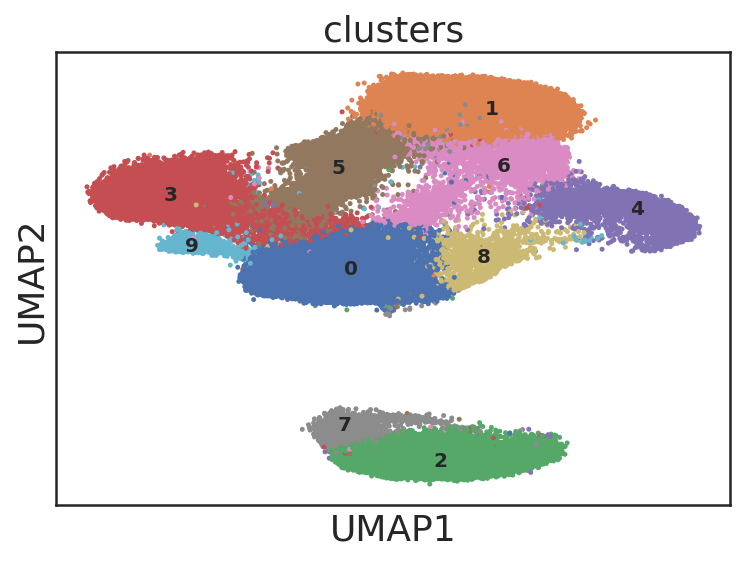

In [4]:
sc.pl.umap(adata_norm, color=['leiden'], size=25, title='clusters', legend_loc='on data')

In [5]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged

normalizing by total count per cell
    finished (0:00:06): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


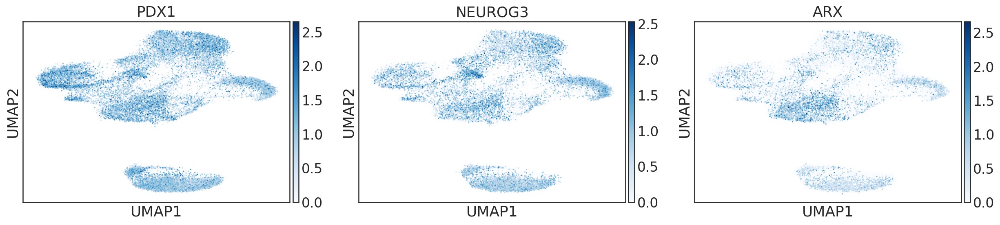

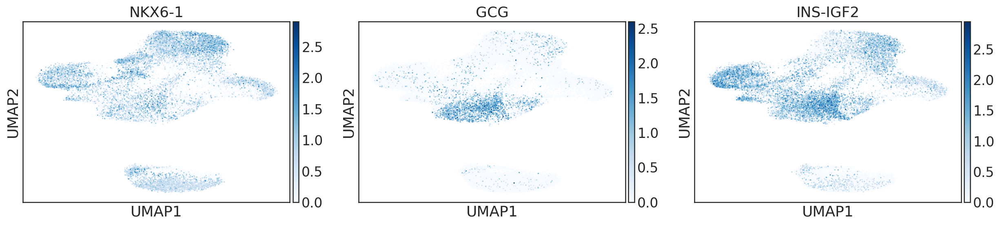

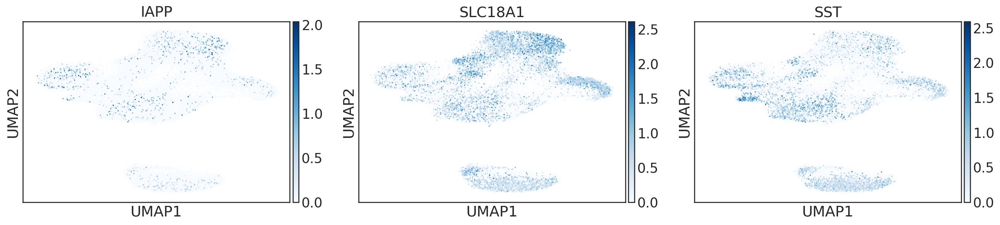

In [6]:
sc.pl.umap(adata_norm, color=['PDX1','NEUROG3','ARX'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['NKX6-1','GCG','INS-IGF2'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['IAPP','SLC18A1','SST'], size=9, color_map='Blues', frameon=True,use_raw=True)

In [7]:
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/GEO/SC-islet_snATAC/processed/final_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/raw_RNAinfer.h5ad')

adata_merged=adata_merged[(adata_merged.obs.index.isin(adata_norm.obs.index)),:]
adata_merged=adata_merged[np.sort(adata_merged.obs.index),:].copy()

adata_norm=adata_norm[(adata_norm.obs.index.isin(adata_merged.obs.index)),:]
adata_norm=adata_norm[np.sort(adata_norm.obs.index),:].copy()
all(adata_norm.obs.index==adata_merged.obs.index)

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


True

In [8]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged

normalizing by total count per cell
    finished (0:00:10): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


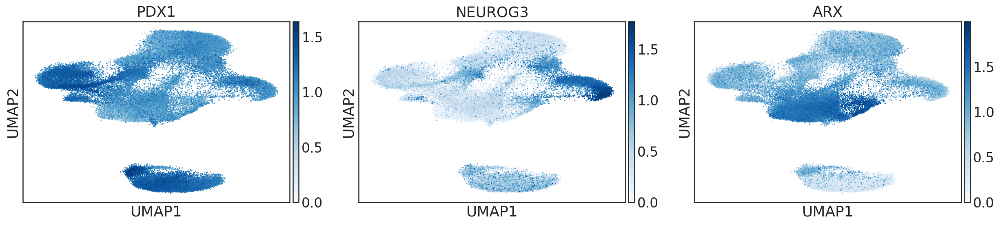

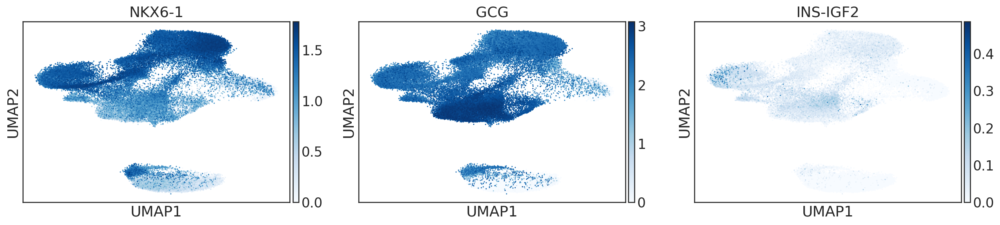

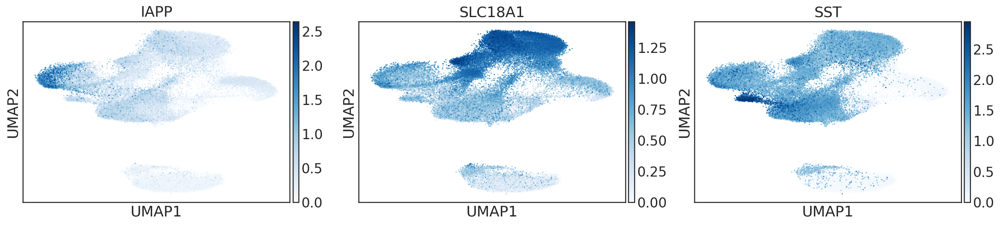

In [9]:
sc.pl.umap(adata_norm, color=['PDX1','NEUROG3','ARX'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['NKX6-1','GCG','INS-IGF2'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['IAPP','SLC18A1','SST'], size=9, color_map='Blues', frameon=True,use_raw=True)

In [10]:
PP1=adata_norm[(adata_norm.obs['leiden']=='2'),:].obs.index
PP2=adata_norm[(adata_norm.obs['leiden']=='7'),:].obs.index
ENP1=adata_norm[(adata_norm.obs['leiden']=='4'),:].obs.index
ENPa=adata_norm[(adata_norm.obs['leiden']=='8'),:].obs.index
ENP2=adata_norm[(adata_norm.obs['leiden']=='6'),:].obs.index
ENP3=adata_norm[(adata_norm.obs['leiden']=='5'),:].obs.index
SCalpha=adata_norm[(adata_norm.obs['leiden']=='0'),:].obs.index
SCEC=adata_norm[(adata_norm.obs['leiden']=='1'),:].obs.index
SCbeta=adata_norm[(adata_norm.obs['leiden']=='3'),:].obs.index
SCdelta=adata_norm[(adata_norm.obs['leiden']=='9'),:].obs.index

adata_norm.obs['anno'] = ['PP1' if i in PP1 else i for i in adata_norm.obs.index]
adata_norm.obs['anno'] = ['PP2' if i in PP2 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENP1' if i in ENP1 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENPa' if i in ENPa else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENP2' if i in ENP2 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENP3' if i in ENP3 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['SCalpha' if i in SCalpha else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['SCEC' if i in SCEC else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['SCbeta' if i in SCbeta else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['SCdelta' if i in SCdelta else i for i in adata_norm.obs['anno']]

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


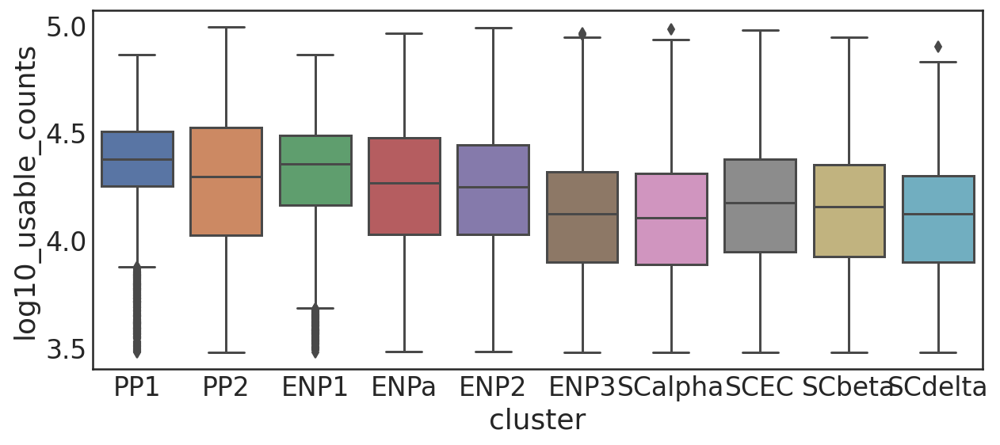

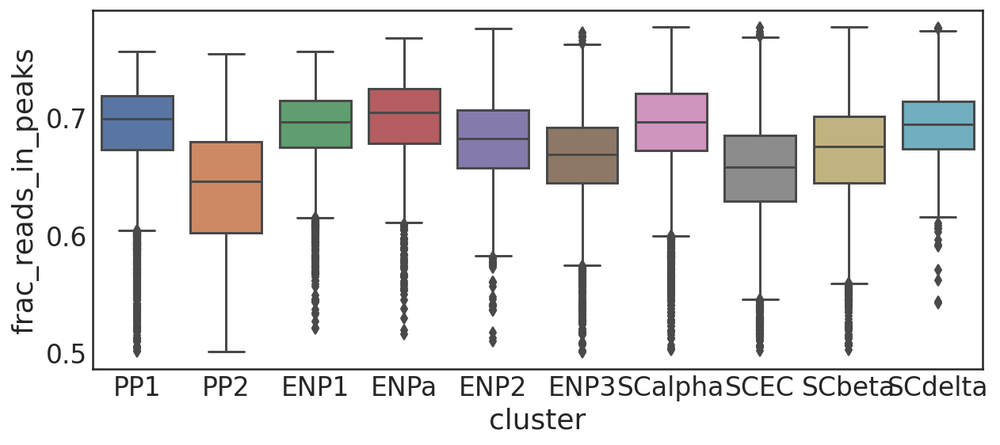

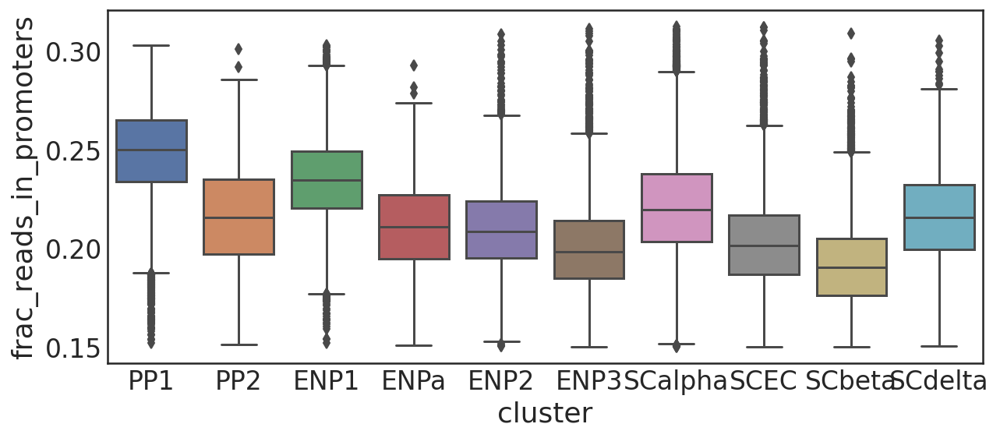

In [11]:
fig, ax1 = plt.subplots(1,1,figsize=(10,4))
sns.boxplot(x='anno', y='log10_n_counts', data=adata_norm.obs,order=['PP1','PP2','ENP1','ENPa','ENP2','ENP3','SCalpha','SCEC','SCbeta','SCdelta'])
ax1.set_xlabel('cluster')
ax1.set_ylabel('log10_usable_counts')
plt.show()

fig, ax1 = plt.subplots(1,1,figsize=(10,4))
sns.boxplot(x='anno', y='frac_reads_in_peaks', data=adata_norm.obs,order=['PP1','PP2','ENP1','ENPa','ENP2','ENP3','SCalpha','SCEC','SCbeta','SCdelta'])
ax1.set_xlabel('cluster')
ax1.set_ylabel('frac_reads_in_peaks')
plt.show()

fig, ax1 = plt.subplots(1,1,figsize=(10,4))
sns.boxplot(x='anno', y='frac_reads_in_promoters', data=adata_norm.obs,order=['PP1','PP2','ENP1','ENPa','ENP2','ENP3','SCalpha','SCEC','SCbeta','SCdelta'])
ax1.set_xlabel('cluster')
ax1.set_ylabel('frac_reads_in_promoters')
plt.show()


# Differentiation scRNA-seq data

In [12]:
## download h5ad objects from GSEXXXX

adata_norm=sc.read('/oasis/tscc/scratch/gaw006/GEO/SC-islet_scRNA/processed/final_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/GEO/SC-islet_scRNA/processed/raw.h5ad')

adata_merged=adata_merged[(adata_merged.obs.index.isin(adata_norm.obs.index)),:]
adata_merged=adata_merged[np.sort(adata_merged.obs.index),:].copy()
all(adata_norm.obs.index==adata_merged.obs.index)


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


True

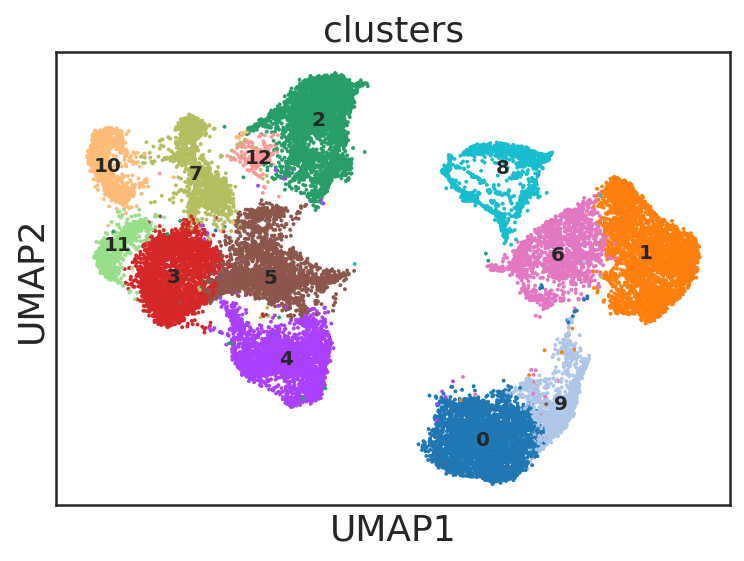

In [13]:
sc.pl.umap(adata_norm, color=['leiden'], size=15, title='clusters',legend_loc='on data')

In [14]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


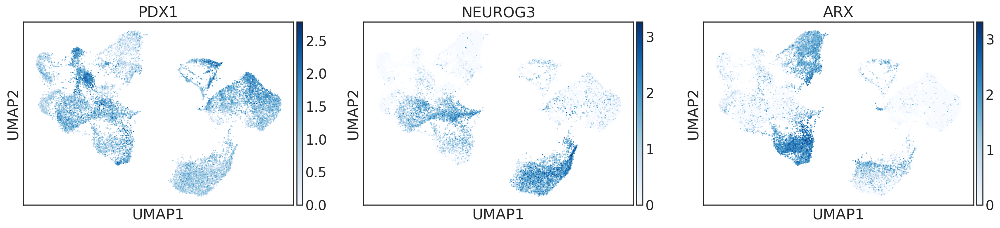

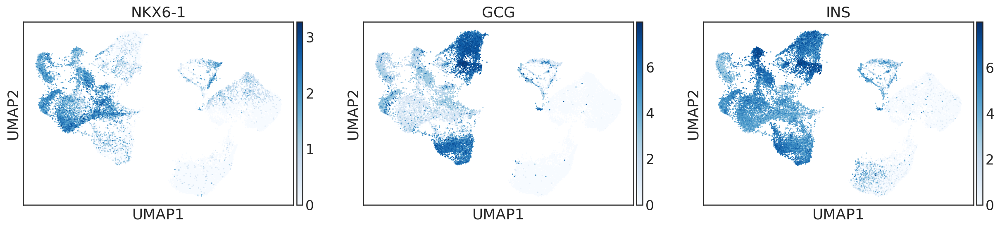

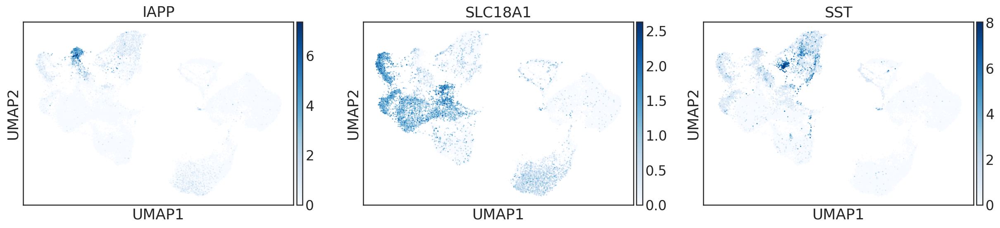

In [15]:
sc.pl.umap(adata_norm, color=['PDX1','NEUROG3','ARX'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['NKX6-1','GCG','INS'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['IAPP','SLC18A1','SST'], size=9, color_map='Blues', frameon=True,use_raw=True)

In [16]:
SC_EC=adata_norm[(adata_norm.obs['leiden'].isin(['10','11'])),:].obs.index
PP_1=adata_norm[(adata_norm.obs['leiden'].isin(['1','6'])),:].obs.index
PP_2=adata_norm[(adata_norm.obs['leiden']=='8'),:].obs.index
ENP_1=adata_norm[(adata_norm.obs['leiden'].isin(['0','9'])),:].obs.index
ENP_alpha=adata_norm[(adata_norm.obs['leiden']=='4'),:].obs.index
ENP_2=adata_norm[(adata_norm.obs['leiden']=='3'),:].obs.index
ENP_3=adata_norm[(adata_norm.obs['leiden']=='5'),:].obs.index
SC_alpha=adata_norm[(adata_norm.obs['leiden']=='2'),:].obs.index
SC_beta=adata_norm[(adata_norm.obs['leiden']=='7'),:].obs.index
SC_delta=adata_norm[(adata_norm.obs['leiden']=='12'),:].obs.index

adata_norm.obs['anno'] = ['SCEC' if i in SC_EC else i for i in adata_norm.obs.index]
adata_norm.obs['anno'] = ['PP1' if i in PP_1 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['PP2' if i in PP_2 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENP1' if i in ENP_1 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENPa' if i in ENP_alpha else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENP2' if i in ENP_2 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['ENP3' if i in ENP_3 else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['SCalpha' if i in SC_alpha else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['SCbeta' if i in SC_beta else i for i in adata_norm.obs['anno']]
adata_norm.obs['anno'] = ['SCdelta' if i in SC_delta else i for i in adata_norm.obs['anno']]

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


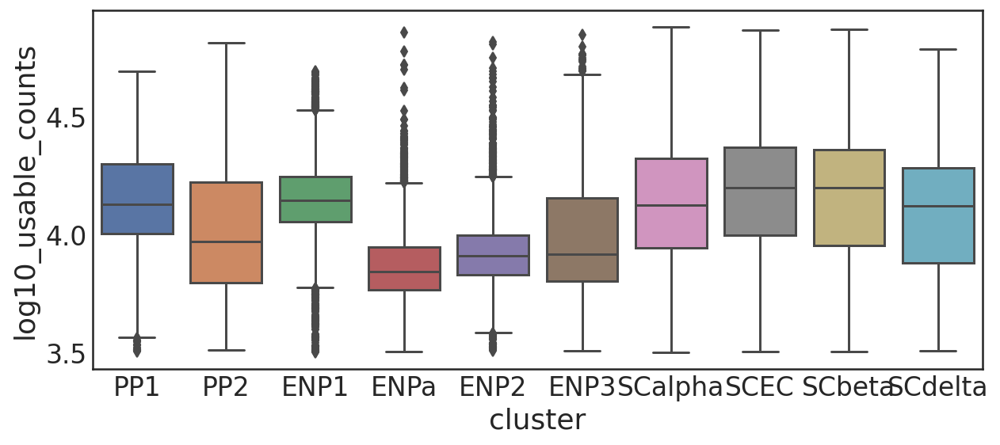

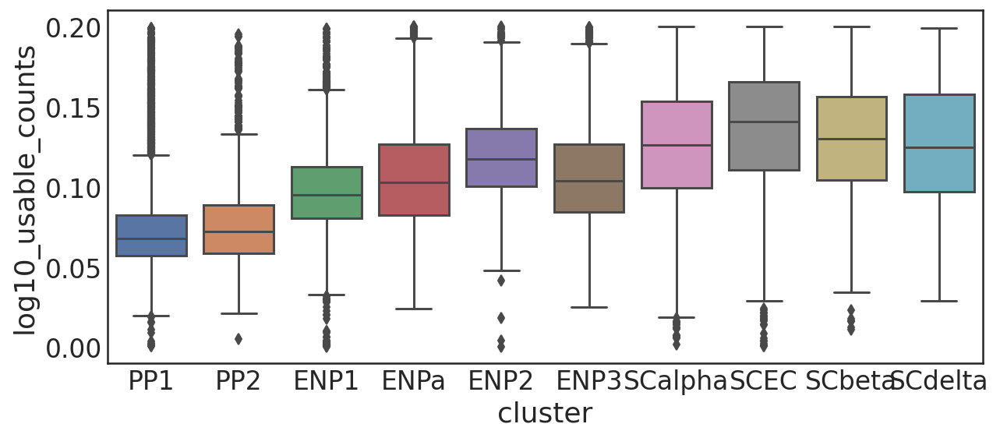

In [17]:
fig, ax1 = plt.subplots(1,1,figsize=(10,4))
sns.boxplot(x='anno', y='log10_n_counts', data=adata_norm.obs,order=['PP1','PP2','ENP1','ENPa','ENP2','ENP3','SCalpha','SCEC','SCbeta','SCdelta'])
ax1.set_xlabel('cluster')
ax1.set_ylabel('log10_usable_counts')
plt.show()

fig, ax1 = plt.subplots(1,1,figsize=(10,4))
sns.boxplot(x='anno', y='percent_mito', data=adata_norm.obs,order=['PP1','PP2','ENP1','ENPa','ENP2','ENP3','SCalpha','SCEC','SCbeta','SCdelta'])
ax1.set_xlabel('cluster')
ax1.set_ylabel('log10_usable_counts')
plt.show()


# Endocrine snATAC-seq

In [25]:
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/endo_snATAC_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/endo_snATAC_raw.h5ad')
adata_merged=adata_merged[(adata_merged.obs.index.isin(adata_norm.obs.index)),:]
adata_merged=adata_merged[np.sort(adata_merged.obs.index),:].copy()

adata_norm=adata_norm[(adata_norm.obs.index.isin(adata_merged.obs.index)),:]
adata_norm=adata_norm[np.sort(adata_norm.obs.index),:].copy()

all(adata_norm.obs.index==adata_merged.obs.index)


True

In [26]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged

normalizing by total count per cell
    finished (0:00:10): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


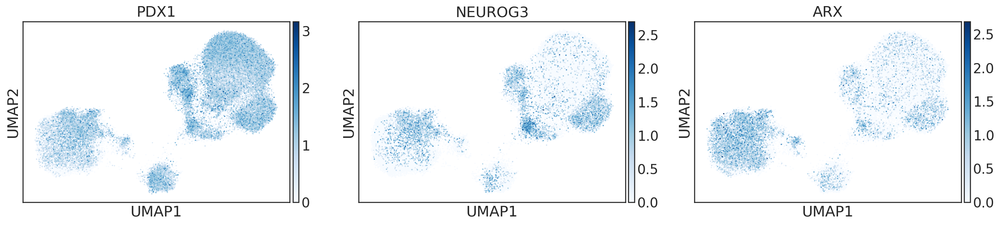

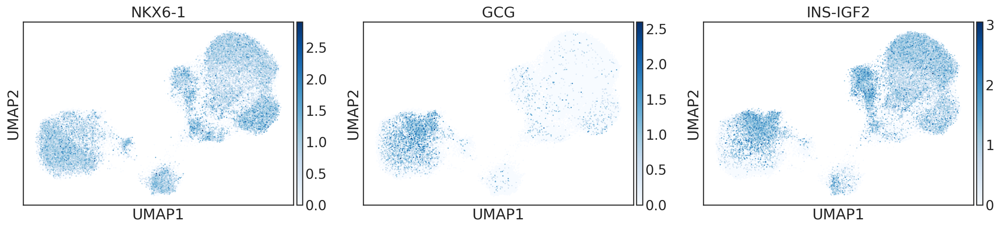

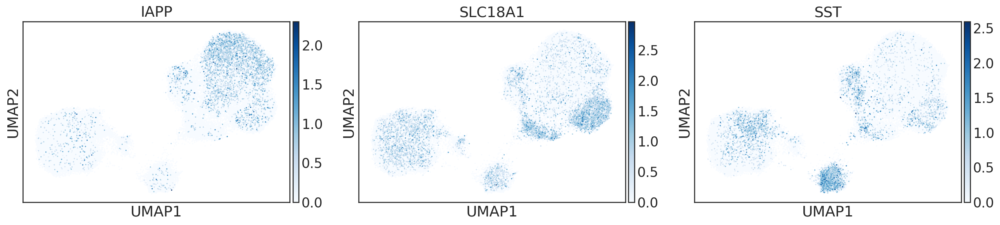

In [27]:
sc.pl.umap(adata_norm, color=['PDX1','NEUROG3','ARX'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['NKX6-1','GCG','INS-IGF2'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['IAPP','SLC18A1','SST'], size=9, color_map='Blues', frameon=True,use_raw=True)

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'anno2' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, whi

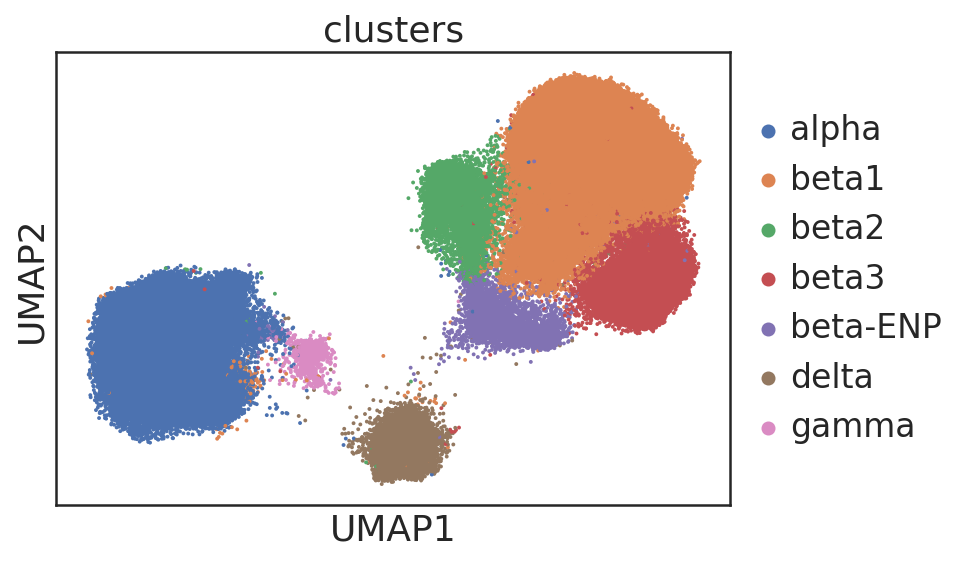

In [28]:
adata_norm.obs['anno2']=['beta-ENP' if b in ['beta4'] else b for b in adata_norm.obs['anno2']]
sc.pl.umap(adata_norm, color=['anno2'], size=15, title='clusters')

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'anno3' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length m

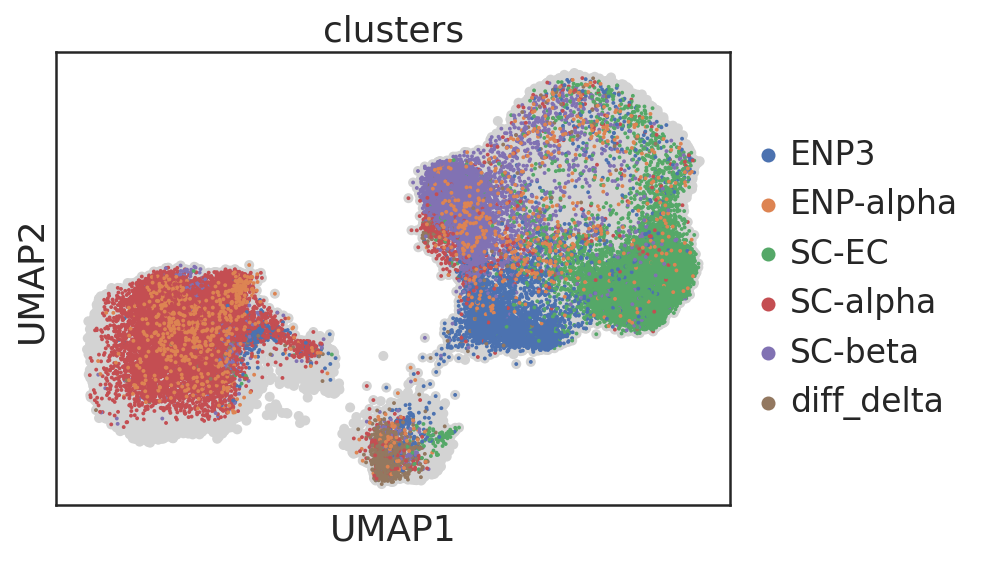

In [29]:
temp_adata=adata_norm[adata_norm.obs['anno1'].isin(['SC_beta','diff_EC','diff_ENP3','diff_ENPalpha','diff_alpha','diff_delta'])].copy()

temp_adata.obs['anno3']=temp_adata.obs['anno1']
temp_adata.obs['anno3']=['ENP-alpha' if b in ['diff_ENPalpha'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['ENP3' if b in ['diff_ENP3'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-alpha' if b in ['diff_alpha'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-EC' if b in ['diff_EC'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-beta' if b in ['SC_beta'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-delta' if b in ['SC_delta'] else b for b in temp_adata.obs['anno3']]

ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['anno3'], size=15, title='clusters',ax=ax)


... storing 'anno3' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argumen

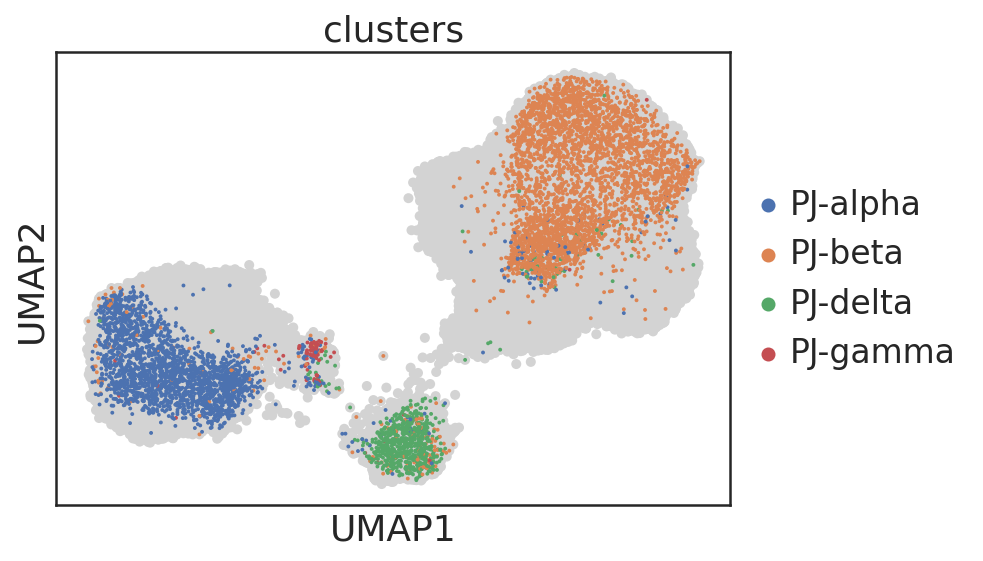

In [30]:
temp_adata=adata_norm[adata_norm.obs['anno1'].isin(['juvenile_alpha','juvenile_beta','juvenile_delta','juvenile_gamma'])].copy()

temp_adata.obs['anno3']=temp_adata.obs['anno1']
temp_adata.obs['anno3']=['PJ-alpha' if b in ['juvenile_alpha'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PJ-beta' if b in ['juvenile_beta'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PJ-delta' if b in ['juvenile_delta'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PJ-gamma' if b in ['juvenile_gamma'] else b for b in temp_adata.obs['anno3']]

ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['anno3'], size=15, title='clusters',ax=ax)

... storing 'anno3' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argumen

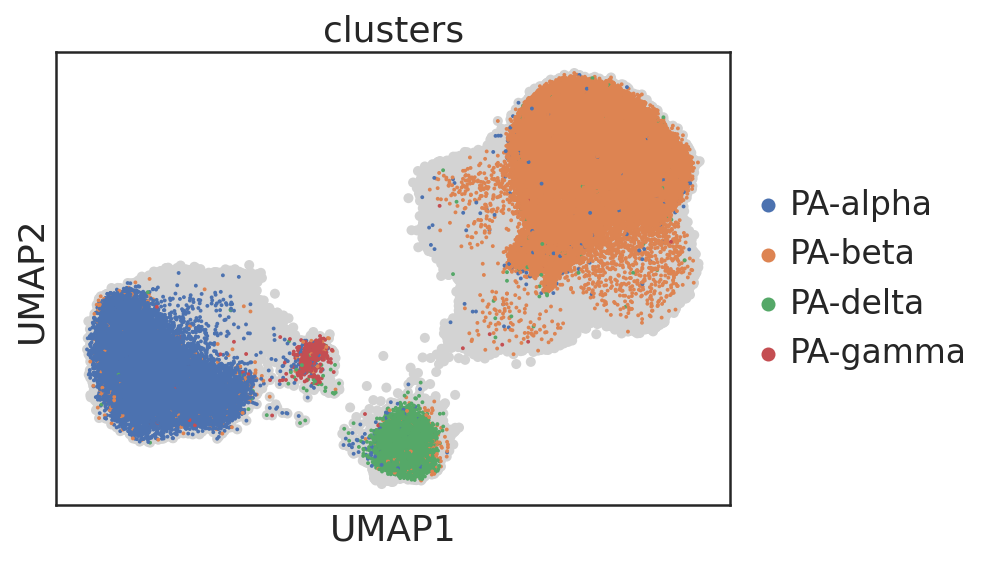

In [31]:
temp_adata=adata_norm[adata_norm.obs['anno1'].isin(['biobank_alpha','biobank_beta','biobank_delta','biobank_gamma'])].copy()
temp_adata.obs['anno3']=temp_adata.obs['anno1']
temp_adata.obs['anno3']=['PA-alpha' if b in ['biobank_alpha'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PA-beta' if b in ['biobank_beta'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PA-delta' if b in ['biobank_delta'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PA-gamma' if b in ['biobank_gamma'] else b for b in temp_adata.obs['anno3']]

ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['anno3'], size=15, title='clusters',ax=ax)

# Endocrine sn/scRNA-seq

In [78]:
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/endo_snRNA_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/endo_snRNA_raw.h5ad')

adata_merged=adata_merged[np.sort(adata_merged.obs.index),:].copy()
adata_norm=adata_norm[np.sort(adata_norm.obs.index),:].copy()
print(all(adata_norm.obs.index==adata_merged.obs.index))


True


In [80]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


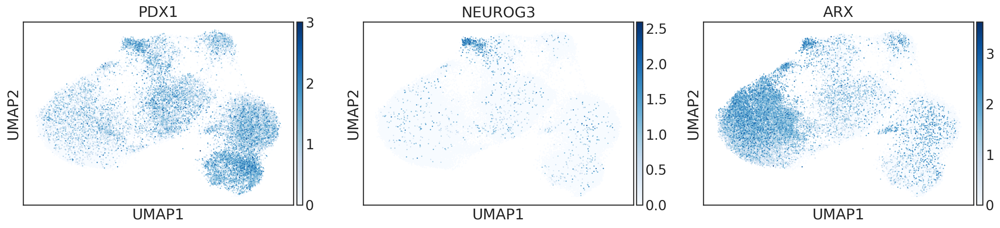

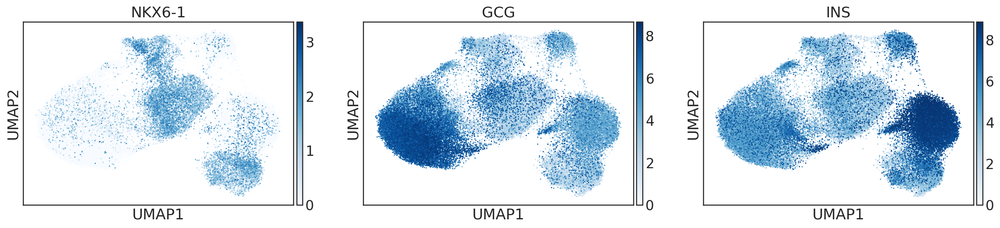

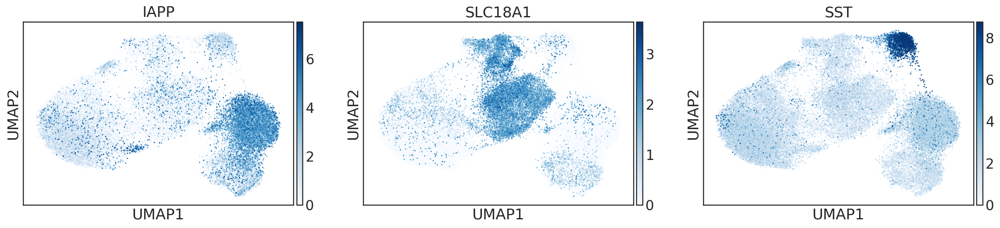

In [81]:
sc.pl.umap(adata_norm, color=['PDX1','NEUROG3','ARX'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['NKX6-1','GCG','INS'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['IAPP','SLC18A1','SST'], size=9, color_map='Blues', frameon=True,use_raw=True)

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'anno2' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, whi

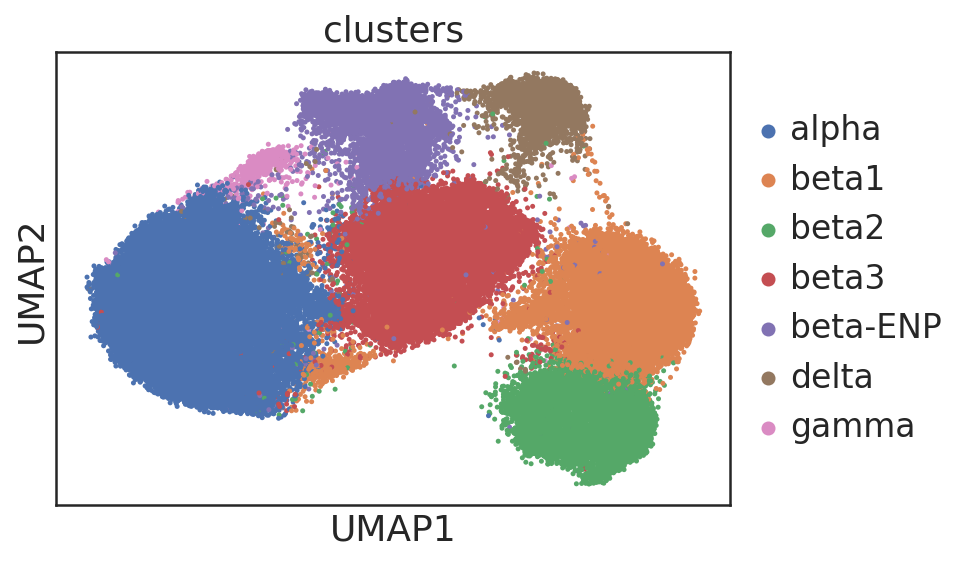

In [82]:
adata_norm.obs['anno2']=['beta-ENP' if b in ['beta4'] else b for b in adata_norm.obs['anno2']]
sc.pl.umap(adata_norm, color=['anno2'], size=25, title='clusters')


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'anno3' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length m

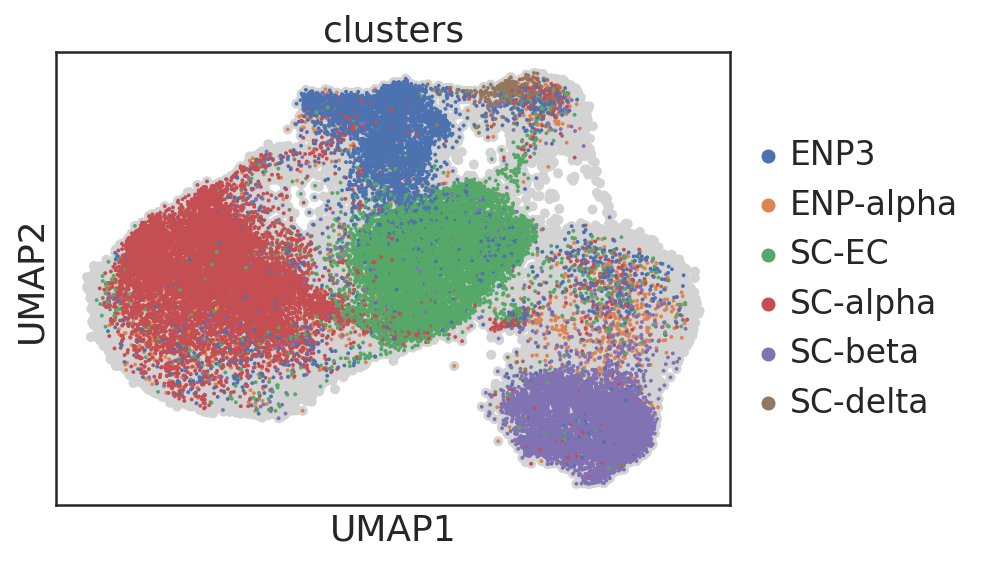

In [83]:
temp_adata=adata_norm[adata_norm.obs['anno'].isin(['ENP3','ENP_alpha','SC_EC','SC_alpha','SC_beta','SC_delta'])].copy()

temp_adata.obs['anno3']=temp_adata.obs['anno']
temp_adata.obs['anno3']=['ENP-alpha' if b in ['ENP_alpha'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['ENP3' if b in ['ENP3'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-alpha' if b in ['SC_alpha'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-EC' if b in ['SC_EC'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-beta' if b in ['SC_beta'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['SC-delta' if b in ['SC_delta'] else b for b in temp_adata.obs['anno3']]

ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['anno3'], size=15, title='clusters',ax=ax)

... storing 'anno3' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argumen

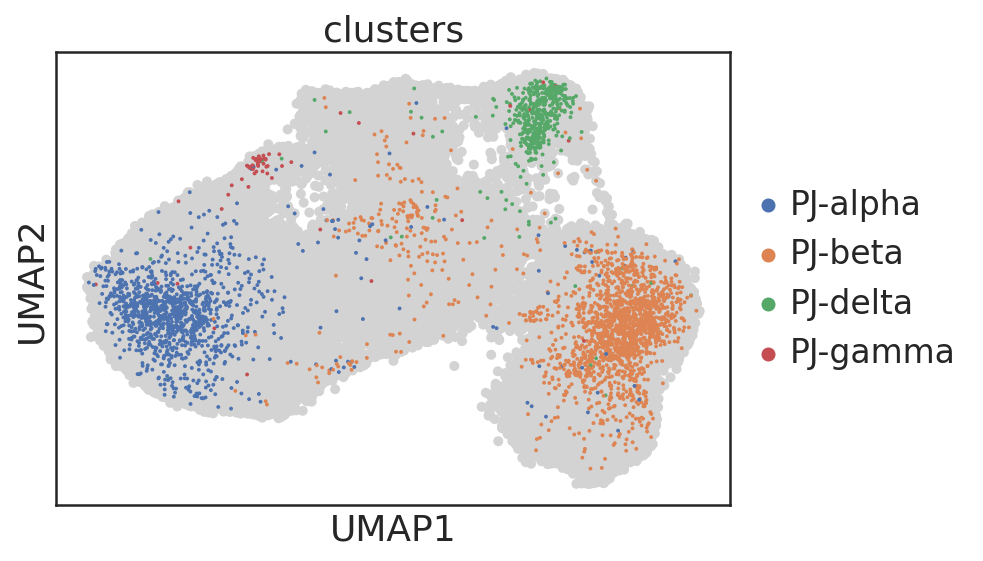

In [84]:
temp_adata=adata_norm[adata_norm.obs['anno1'].isin(['alpha_J','beta_J','delta_J','gamma_J'])].copy()
temp_adata.obs['anno3']=temp_adata.obs['anno1']
temp_adata.obs['anno3']=['PJ-alpha' if b in ['alpha_J'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PJ-beta' if b in ['beta_J'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PJ-delta' if b in ['delta_J'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PJ-gamma' if b in ['gamma_J'] else b for b in temp_adata.obs['anno3']]

ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['anno3'], size=15, title='clusters',ax=ax)


... storing 'anno3' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argumen

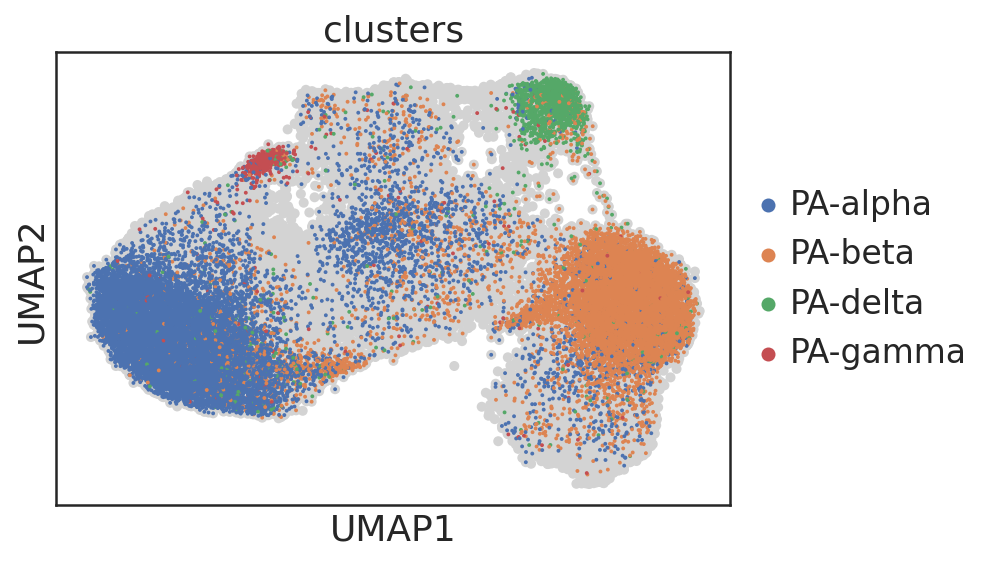

In [85]:
temp_adata=adata_norm[adata_norm.obs['anno1'].isin(['alpha_adult','beta_adult','delta_adult','gamma_adult'])].copy()
temp_adata.obs['anno3']=temp_adata.obs['anno1']
temp_adata.obs['anno3']=['PA-alpha' if b in ['alpha_adult'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PA-beta' if b in ['beta_adult'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PA-delta' if b in ['delta_adult'] else b for b in temp_adata.obs['anno3']]
temp_adata.obs['anno3']=['PA-gamma' if b in ['gamma_adult'] else b for b in temp_adata.obs['anno3']]

ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['anno3'], size=15, title='clusters',ax=ax)

# Childhood (snATAC-seq)

In [86]:
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/GEO/Childhood_snATAC/processed/final_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/GEO/Childhood_snATAC/processed/raw_5kb.h5ad')

print(all(adata_merged.obs.index==adata_norm.obs.index))


True


In [87]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


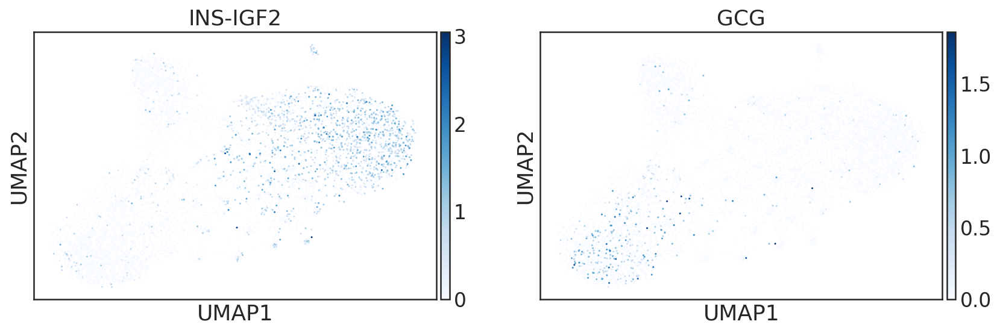

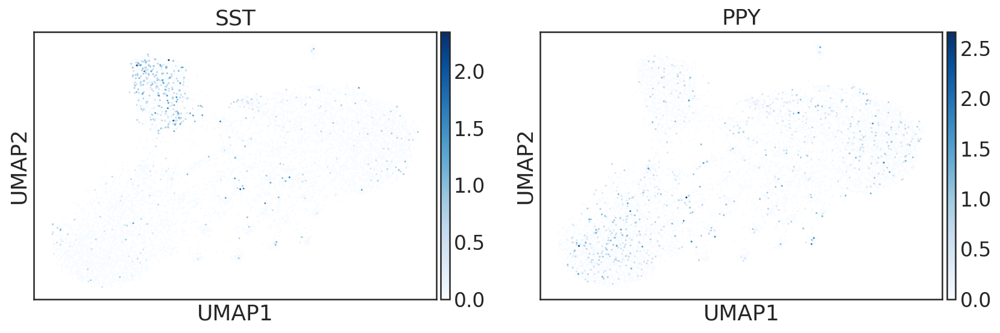

In [88]:
sc.pl.umap(adata_norm, color=['INS-IGF2','GCG'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['SST','PPY'], size=9, color_map='Blues', frameon=True,use_raw=True)


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster' as categorical


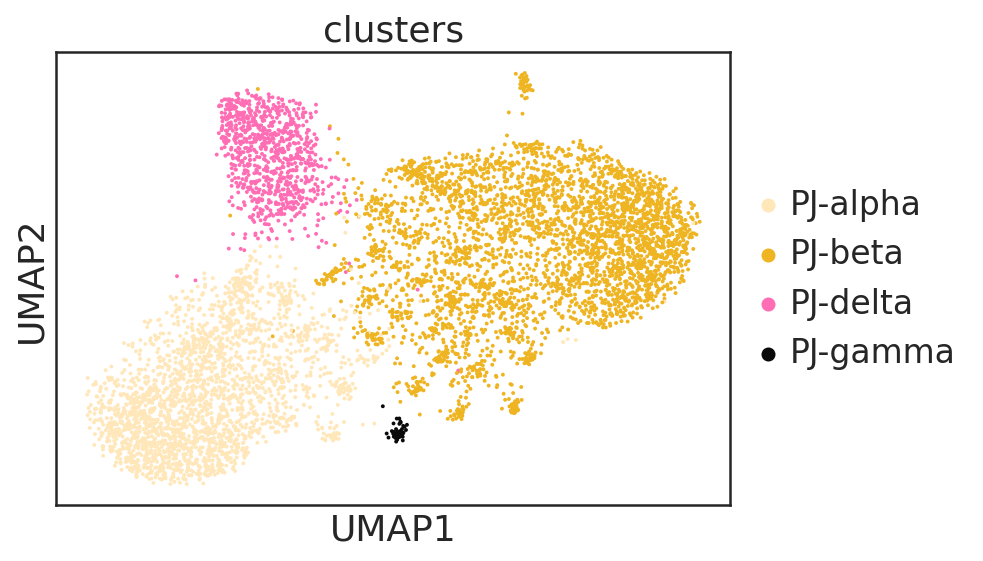

In [89]:
adata_norm.obs['cluster']=adata_norm.obs['leiden']

adata_norm.obs['cluster']=['PJ-alpha' if b in ['1'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PJ-beta' if b in ['0'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PJ-delta' if b in ['2'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PJ-gamma' if b in ['3'] else b for b in adata_norm.obs['cluster']]


#sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters', legend_loc='on data')
adata_norm.uns['cluster_colors']=['#FFE7BA','#EEB422','#FF6EB4','#0A0A0A']
sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters')

# Childhood (sn/scRNA-seq)

In [90]:
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/GEO/Childhood_snRNA/processed/final_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/GEO/Childhood_snRNA/processed/raw.h5ad')

adata_merged=adata_merged[np.sort(adata_merged.obs.index),:].copy()
adata_norm=adata_norm[np.sort(adata_norm.obs.index),:].copy()
all(adata_norm.obs.index==adata_merged.obs.index)


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


True

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


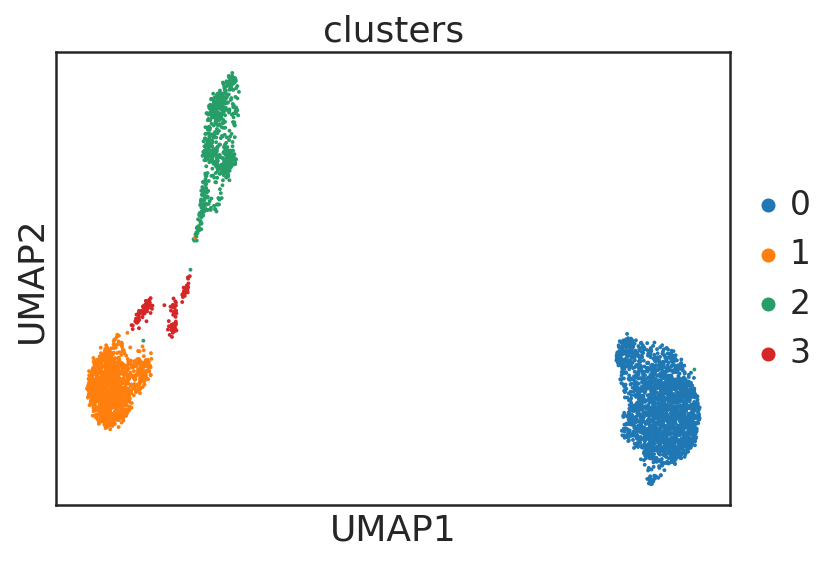

In [91]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged
sc.pl.umap(adata_norm, color=['leiden'], size=15, title='clusters')


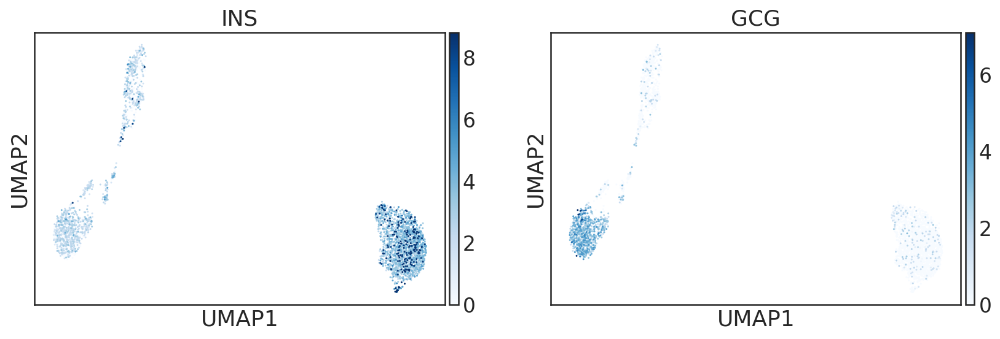

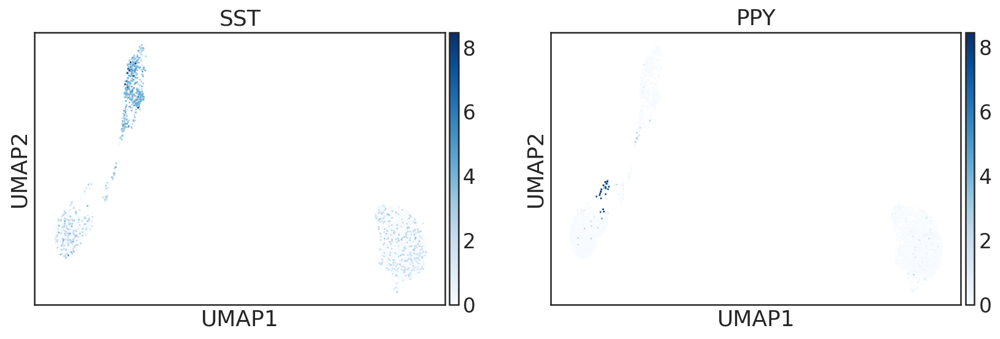

In [92]:
sc.pl.umap(adata_norm, color=['INS','GCG'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['SST','PPY'], size=9, color_map='Blues', frameon=True,use_raw=True)


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster' as categorical


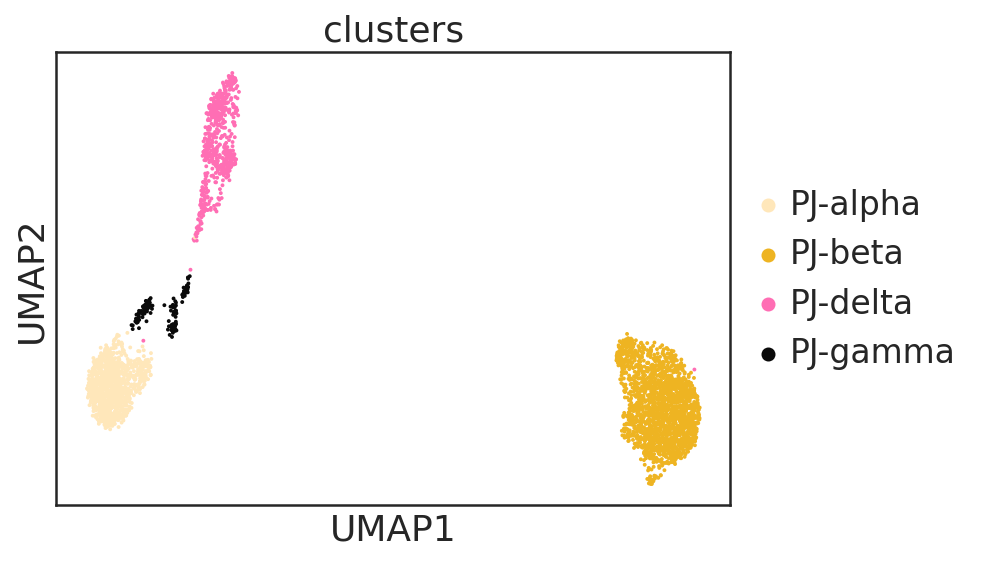

In [93]:
adata_norm.obs['cluster']=adata_norm.obs['leiden']

adata_norm.obs['cluster']=['PJ-alpha' if b in ['1'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PJ-beta' if b in ['0'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PJ-delta' if b in ['2'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PJ-gamma' if b in ['3'] else b for b in adata_norm.obs['cluster']]


#sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters', legend_loc='on data')
adata_norm.uns['cluster_colors']=['#FFE7BA','#EEB422','#FF6EB4','#0A0A0A']
sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters')

In [94]:
snRNA_sample=['MM433','MM434','MM464','MM465','MM466','MM356','MM359','MM360','MM381','MM382','MM400','MM404','MM407','MM426','MM554','MM558','MM561','sn_MM587','sn_MM588','sn_MM589']

##snRNAseq
sc_cell=adata_norm[~(adata_norm.obs['donor'].isin(snRNA_sample)),:].obs.index
sn_cell=adata_norm[(adata_norm.obs['donor'].isin(snRNA_sample)),:].obs.index

adata_norm.obs['tech'] = ['scRNAseq' if i in sc_cell else i for i in adata_norm.obs.index]
adata_norm.obs['tech'] = ['snRNAseq' if i in sn_cell else i for i in adata_norm.obs['tech']]




/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


... storing 'tech' as categorical
... storing 'tech' as categorical


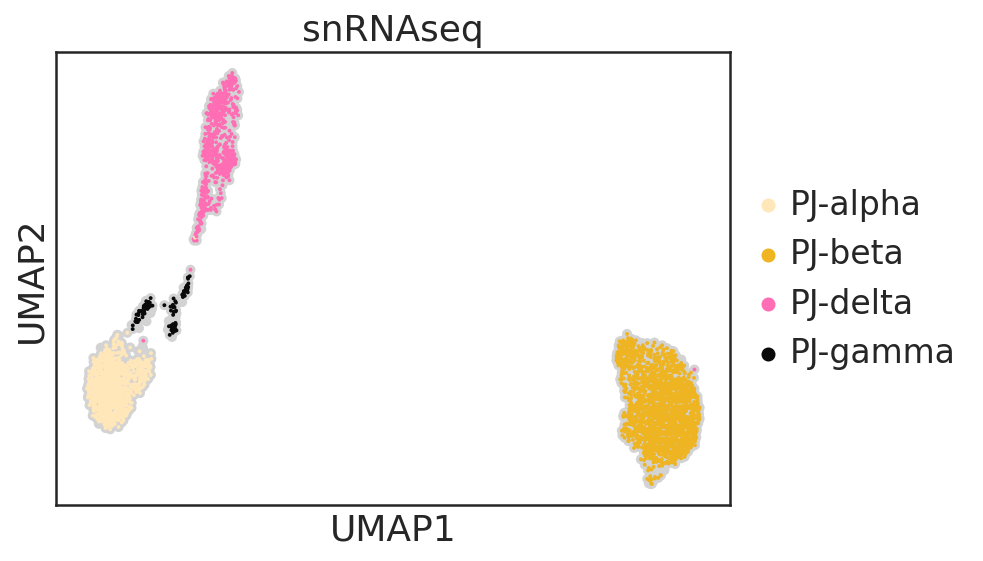

In [95]:
temp_adata=adata_norm[adata_norm.obs['tech'].isin(['snRNAseq'])].copy()
ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['cluster'], size=15, title='snRNAseq',ax=ax)


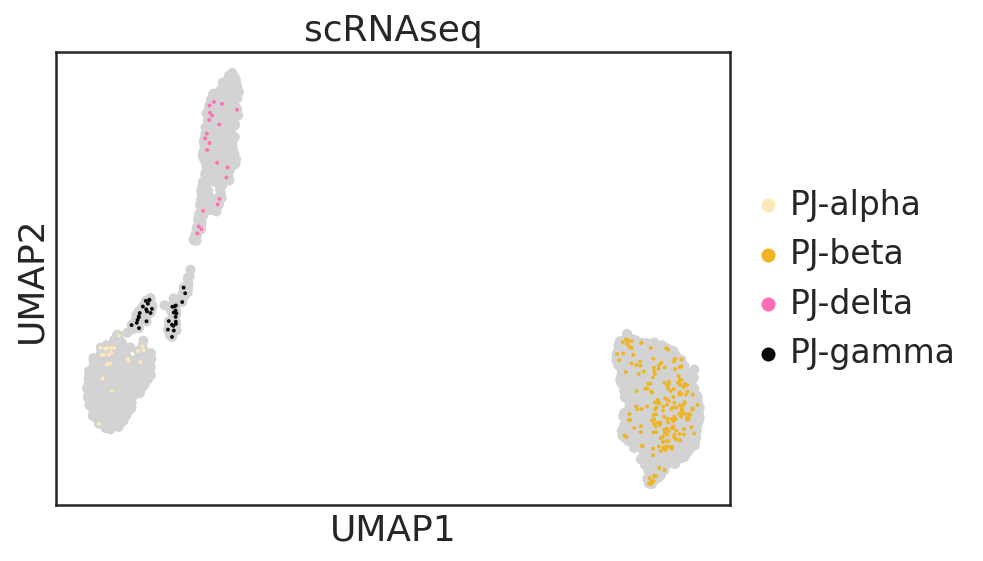

In [96]:
temp_adata=adata_norm[adata_norm.obs['tech'].isin(['scRNAseq'])].copy()
ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['cluster'], size=15, title='scRNAseq',ax=ax)

# Adult (snATAC-seq)

In [100]:
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/adult_endo_ATAC_raw.h5ad')
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/adult_endo_ATAC_cluster.h5ad')
print(all(adata_norm.obs.index==adata_merged.obs.index))



True

In [101]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged


normalizing by total count per cell


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


    finished (0:00:06): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


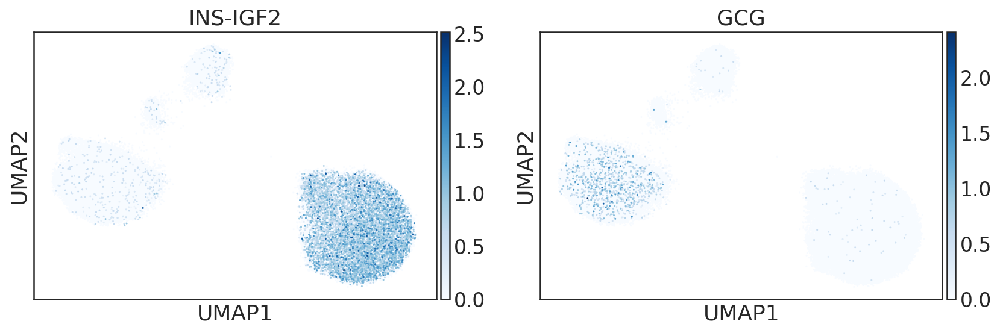

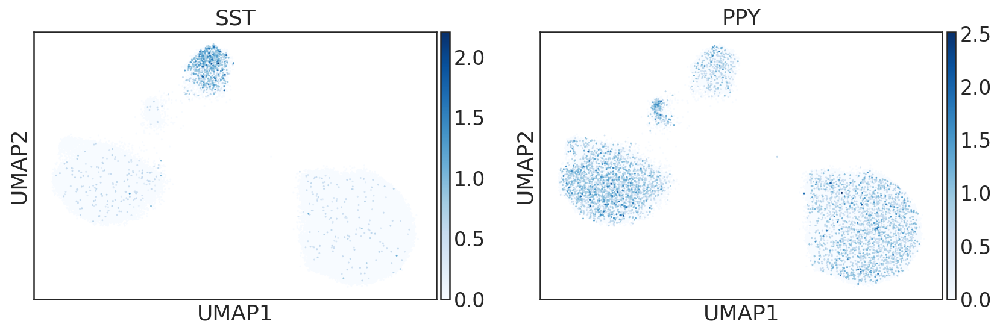

In [102]:
sc.pl.umap(adata_norm, color=['INS-IGF2','GCG'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['SST','PPY'], size=9, color_map='Blues', frameon=True,use_raw=True)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

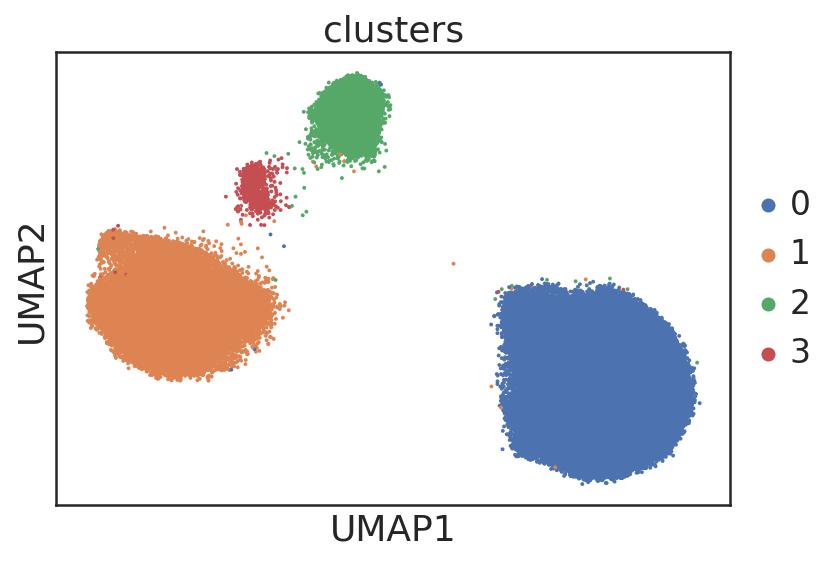

In [103]:
adata_norm.obs['cluster']=adata_norm.obs['leiden']
sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters')


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster' as categorical


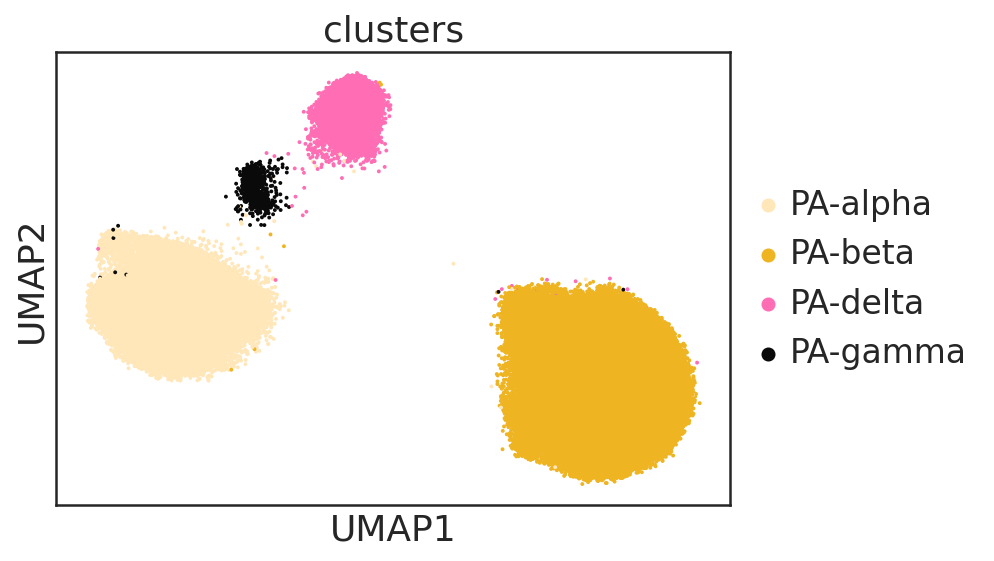

In [104]:
adata_norm.obs['cluster']=adata_norm.obs['leiden']

adata_norm.obs['cluster']=['PA-alpha' if b in ['1'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PA-beta' if b in ['0'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PA-delta' if b in ['2'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PA-gamma' if b in ['3'] else b for b in adata_norm.obs['cluster']]


#sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters', legend_loc='on data')
adata_norm.uns['cluster_colors']=['#FFE7BA','#EEB422','#FF6EB4','#0A0A0A']
sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters')

# Adult (snRNA-seq)

In [114]:
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/adult_endo_RNA_cluster.h5ad')
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/share/SCislet/adult_endo_RNA_raw.h5ad')
adata_merged=adata_merged[np.sort(adata_merged.obs.index),:].copy()
adata_norm=adata_norm[np.sort(adata_norm.obs.index),:].copy()
print(all(adata_norm.obs.index==adata_merged.obs.index))


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


True


In [115]:
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


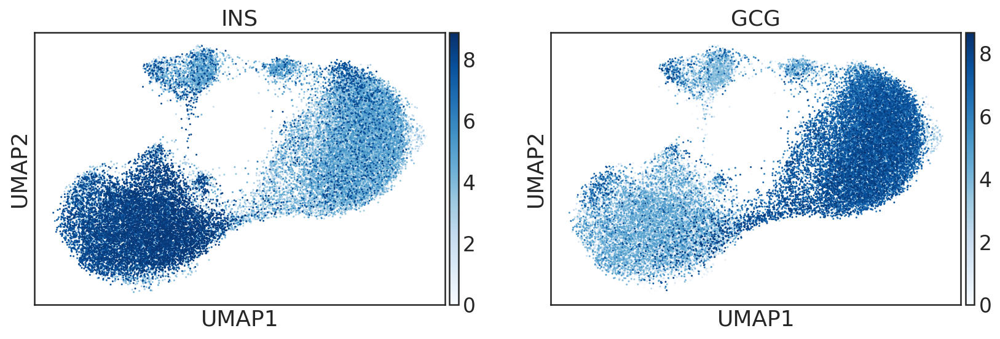

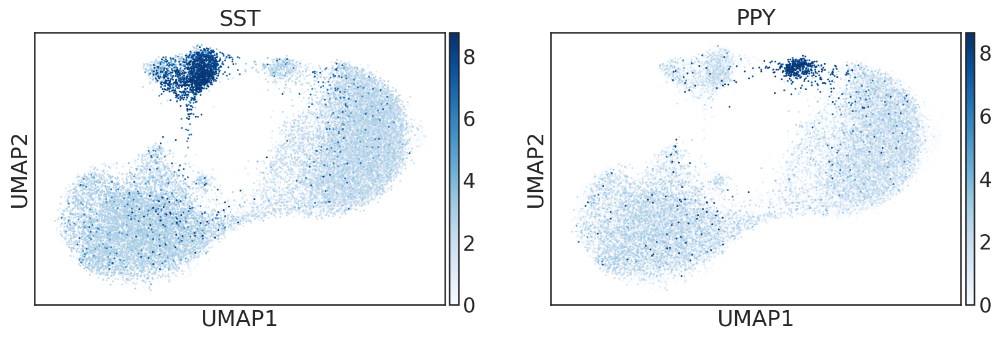

In [116]:
sc.pl.umap(adata_norm, color=['INS','GCG'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['SST','PPY'], size=9, color_map='Blues', frameon=True,use_raw=True)


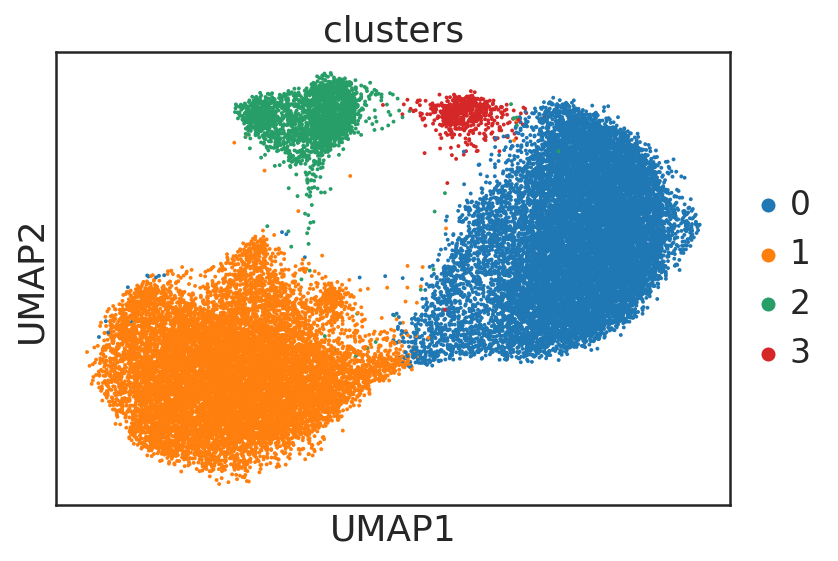

In [117]:
sc.pl.umap(adata_norm, color=['leiden'], size=15, title='clusters')

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster' as categorical


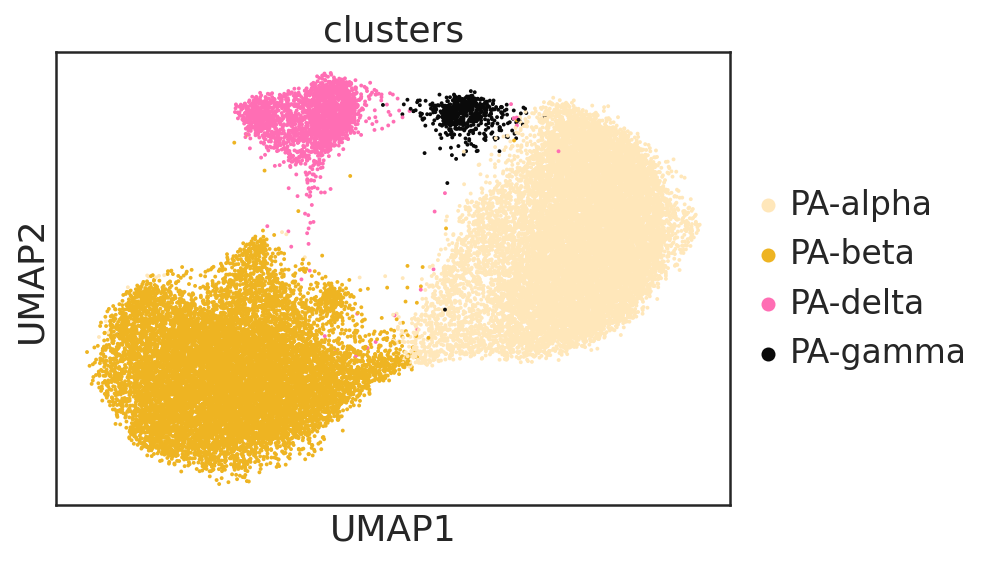

In [118]:
adata_norm.obs['cluster']=adata_norm.obs['leiden']

adata_norm.obs['cluster']=['PA-alpha' if b in ['0'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PA-beta' if b in ['1'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PA-delta' if b in ['2'] else b for b in adata_norm.obs['cluster']]
adata_norm.obs['cluster']=['PA-gamma' if b in ['3'] else b for b in adata_norm.obs['cluster']]

adata_norm.uns['cluster_colors']=['#FFE7BA','#EEB422','#FF6EB4','#0A0A0A']
sc.pl.umap(adata_norm, color=['cluster'], size=15, title='clusters')

In [119]:
snRNA_sample=['MM433','MM434','MM464','MM465','MM466','MM356','MM359','MM360','MM381','MM382','MM400','MM404','MM407','MM426','MM554','MM558','MM561','sn_MM587','sn_MM588','sn_MM589']


##snRNAseq
sc_cell=adata_norm[~(adata_norm.obs['donor'].isin(snRNA_sample)),:].obs.index
sn_cell=adata_norm[(adata_norm.obs['donor'].isin(snRNA_sample)),:].obs.index

adata_norm.obs['tech'] = ['scRNAseq' if i in sc_cell else i for i in adata_norm.obs.index]
adata_norm.obs['tech'] = ['snRNAseq' if i in sn_cell else i for i in adata_norm.obs['tech']]


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/gaw006/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


... storing 'tech' as categorical
... storing 'tech' as categorical


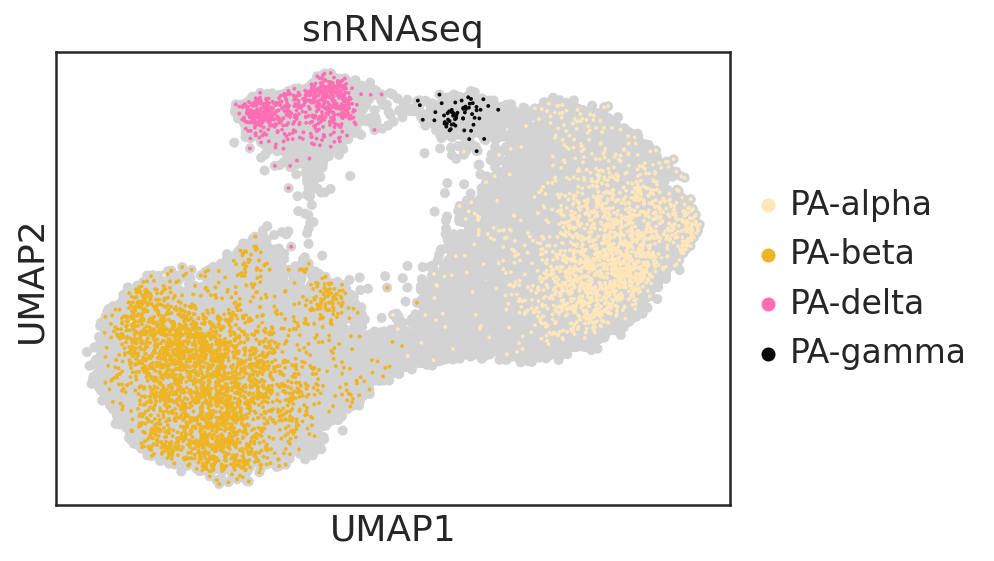

In [120]:
temp_adata=adata_norm[adata_norm.obs['tech'].isin(['snRNAseq'])].copy()
ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['cluster'], size=15, title='snRNAseq',ax=ax)


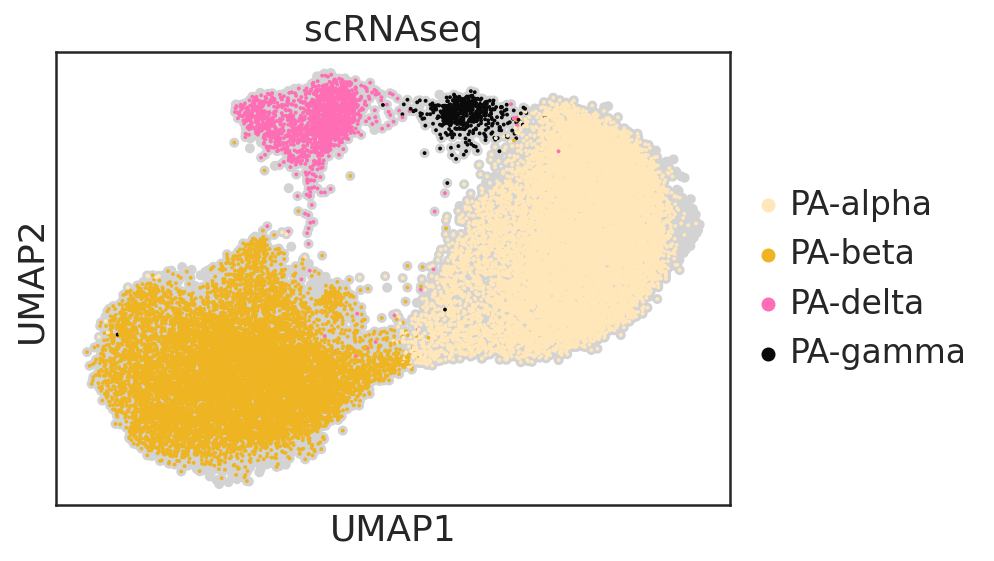

In [121]:
temp_adata=adata_norm[adata_norm.obs['tech'].isin(['scRNAseq'])].copy()
ax = sc.pl.umap(adata_norm, size=100, show=False)
sc.pl.umap(temp_adata,color=['cluster'], size=15, title='scRNAseq',ax=ax)